In [6]:
import sys
sys.path.insert(0, "/home/pwahle/proliferating_RGC/")

import yaml
import importlib
import modules
importlib.reload(modules)
import os
from pathlib import Path
import subprocess

# load global variables and parameters
with open("../params.yml", 'r') as ymlfile:
    cfg = yaml.load(ymlfile, Loader=yaml.FullLoader)

globals().update(cfg)
r_path = str(Path('/usr/local/R-4.0.3/bin/Rscript'))  # path to r interpreter

from scipy import ndimage
import re
import cv2
from scipy import ndimage as ndi
import copy
import numpy as np
import matplotlib as mpl
import os
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io

In [7]:
data_path = data_path + 'exp2/'
rawpath = data_path + 'MIPs/'
metadf = modules.get_metadata(rawpath)

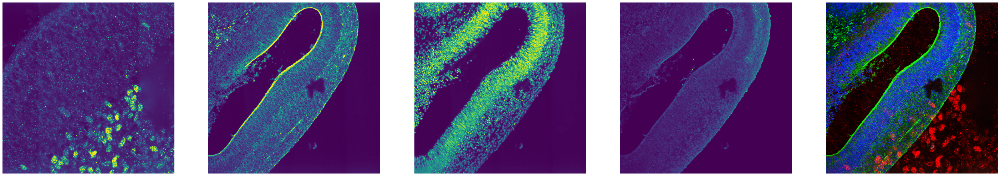

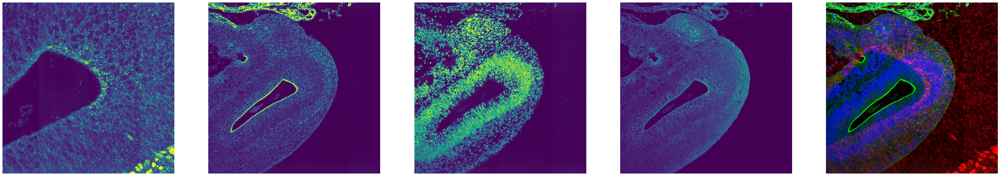

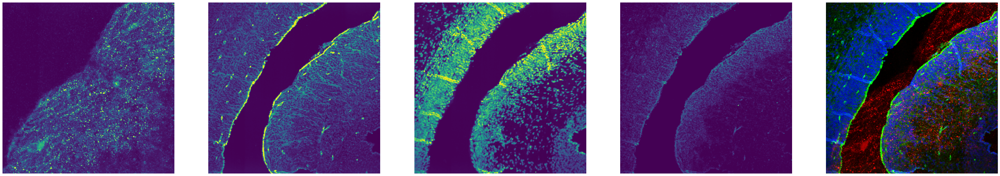

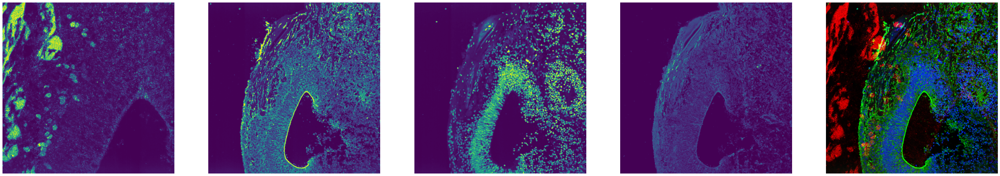

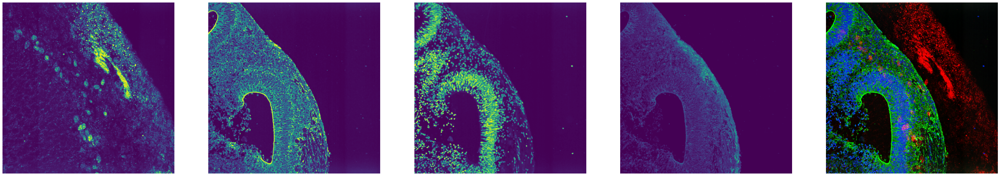

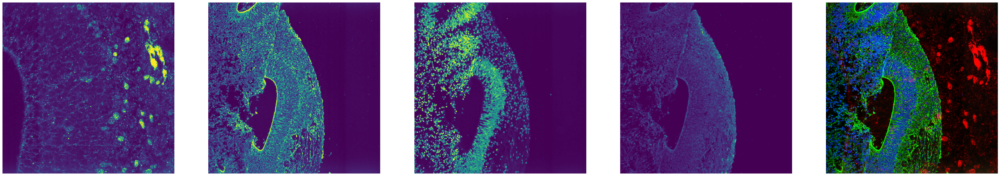

In [9]:
def scale_image(image, percentile=0):
    if percentile == 0:
        image = np.interp(image, (np.percentile(image, 30), np.percentile(image, 100 - 0.01)), (0, +65535))
    else:
        image = np.interp(image, (np.percentile(image, percentile), np.percentile(image, 100 - percentile)), (0, +65535))
    return image

wells = np.unique(metadf['well_id'])
for well in wells:
    filename1 = metadf[(metadf['well_id'] == well)& (metadf['channel'] == 1)]['file'].values[0]
    filename2 = metadf[(metadf['well_id'] == well)& (metadf['channel'] == 2)]['file'].values[0]
    filename3 = metadf[(metadf['well_id'] == well)& (metadf['channel'] == 3)]['file'].values[0]
    filename4 = metadf[(metadf['well_id'] == well)& (metadf['channel'] == 4)]['file'].values[0]
    
    img1 = io.imread(data_path + 'denoised/' + filename1)
    img2 = io.imread(data_path + 'denoised/' + filename2)
    img3 = io.imread(data_path + 'denoised/' + filename3)
    img4 = io.imread(data_path + 'denoised/' + filename4)
    
    r = scale_image(img2,percentile=1)
    g = scale_image(img3,percentile=1)
    b = scale_image(img4,percentile=1)
    stack = np.dstack([r/65535,g/65535,b/65535])
    
    fig, ax = plt.subplots(1,5,figsize = (50,10))
    ax[0].imshow(r)
    ax[0].axis('off')
    ax[1].imshow(g)
    ax[1].axis('off')
    ax[2].imshow(b)
    ax[2].axis('off')
    ax[3].imshow(scale_image(img1,0))
    ax[3].axis('off')
    ax[4].imshow(stack)
    ax[4].axis('off')
    plt.show()